# Practice 18

# Image Enhancement and denoising

### import part

In [15]:
import cv2 as cv

import matplotlib.pyplot as plt
import numpy as np

In [16]:
def show_img_cv (img_title, img):
    cv.imshow(img_title,img)
    cv.waitKey(0)
    cv.destroyWindow()

In [17]:
def image_plot (img , width =6 , hight = 8 , c_map='gray' , title = 'image'):
    plt.figure(figsize=(hight,width),dpi=100)
    plt.axis('off')
    plt.imshow(img, cmap=c_map)
    plt.title(title)
    plt.show()

In [18]:
def display_hist (img , channel = 0, histsize = 256, range= (0,256), title = 'histogram'):

    hist_img = cv.calcHist([img],[channel],None,[histsize],range)
    plt.figure(figsize=(6,4),dpi = 100)
    plt.plot(hist_img)
    plt.title(title)
    plt.show()


In [19]:
def display_hist_bins(img, bins = 256, range=(0,256), title = 'histogram'):
    plt.figure(figsize= (6,4) , dpi=100)
    plt.hist(img.flat , bins , range)
    plt.title(title)
    plt.show()

In [20]:
def show_multiple_img(row, columns, img, vmin=0, vmax=255):
    fig = plt.figure(figsize=(15,17),dpi=100)
    for i in range(len(img)):
        fig.add_subplot(row, columns, i+1)
        plt.imshow (img[i],cmap='gray', vmin=vmin , vmax = vmax)
        plt.axis('off')
        plt.title('img'+str(i))

## Read Image

In [21]:
org_img = cv.imread(r'img/input.jpg',cv.IMREAD_UNCHANGED)

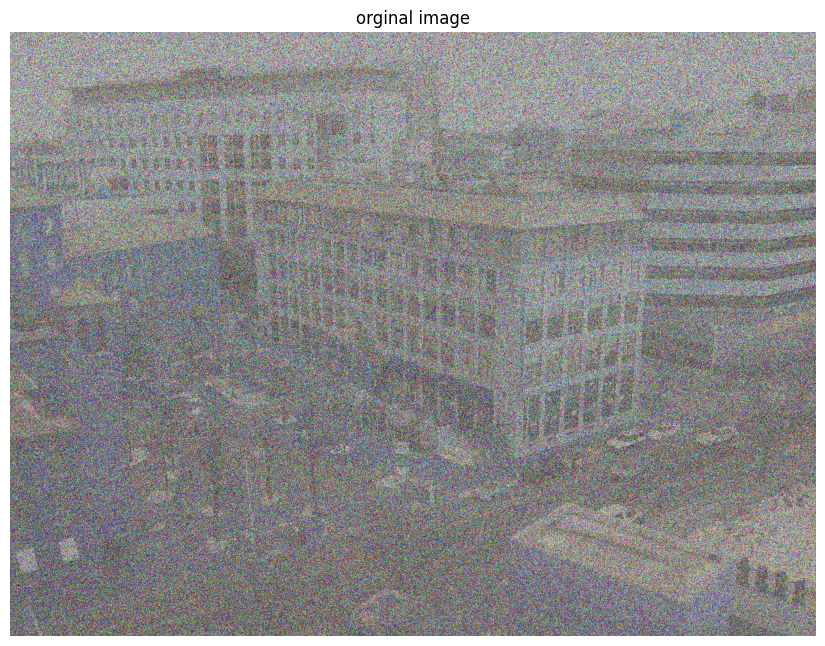

In [22]:
image_plot(org_img,width = 8, hight = 12 , title = 'orginal image')

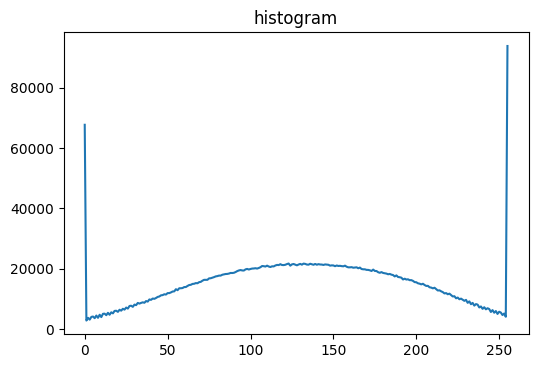

In [23]:
display_hist(org_img)

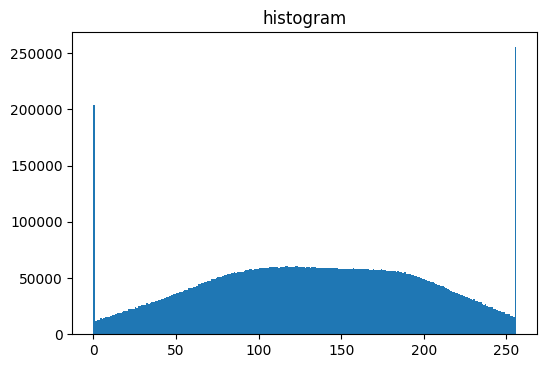

In [24]:
display_hist_bins(org_img)

# KLAHE

In [25]:
img_gray = cv.cvtColor(org_img,cv.COLOR_BGR2GRAY)
img_color = cv.cvtColor(org_img,cv.COLOR_BGR2RGB)

In [26]:
clahe = cv.createCLAHE(clipLimit=100)
r,g,b = cv.split(img_color)
clahe_r = clahe.apply(r)
clahe_g = clahe.apply(g)
clahe_b = clahe.apply(b)

clahe_img_color = cv.merge((clahe_r,clahe_g,clahe_b))

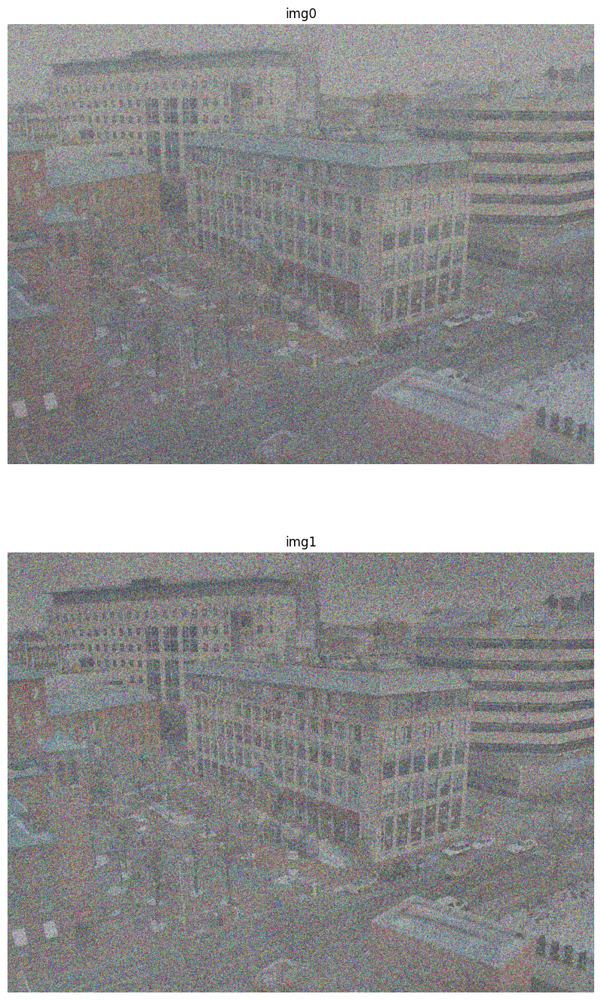

In [27]:
 show_multiple_img(row=2,columns=1,img=(img_color,clahe_img_color))

## Denoising

### First apply CLAHE, ad then apply Denoising

### Gausian Denoising

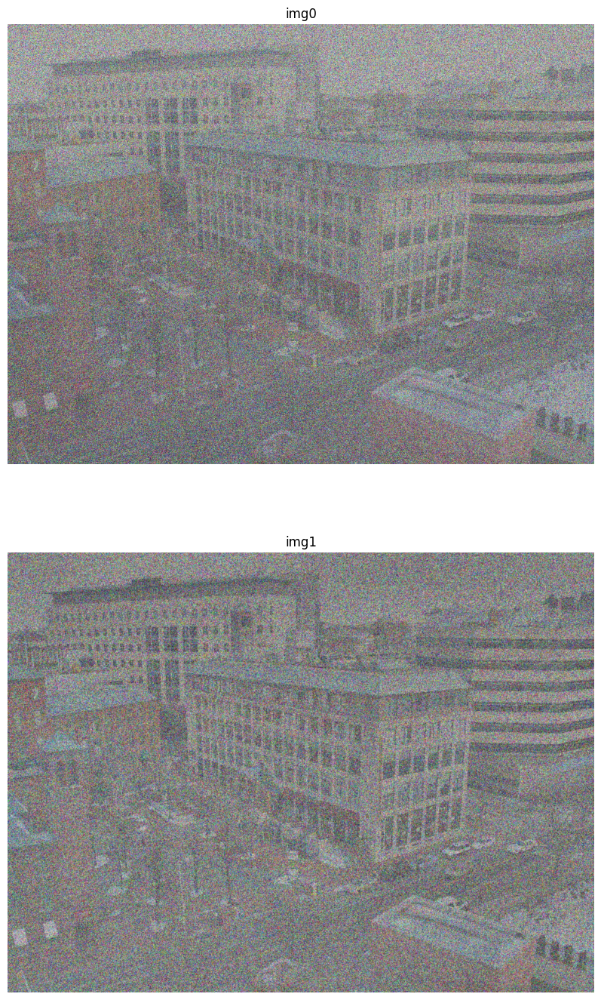

In [28]:
img_gaussian_kenel_denoising= cv.GaussianBlur(clahe_img_color,(3,3),0)
show_multiple_img(2,1,(img_color,img_gaussian_kenel_denoising))

### Box Denoising

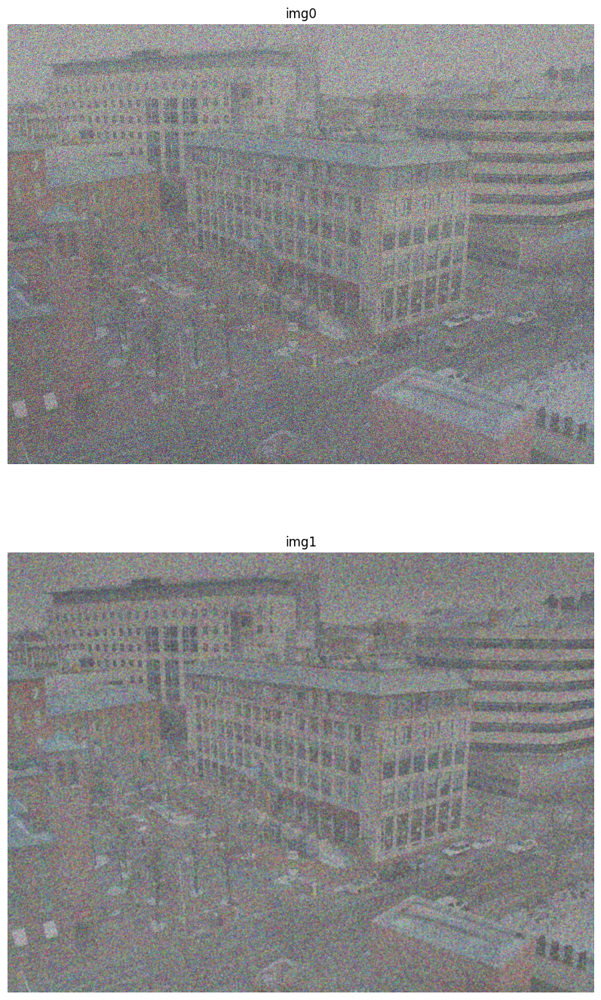

In [29]:
img_kernel_box_denoising= cv.blur(clahe_img_color,(5,5))
show_multiple_img(2,1,(img_color,img_kernel_box_denoising))

### Median Denoising

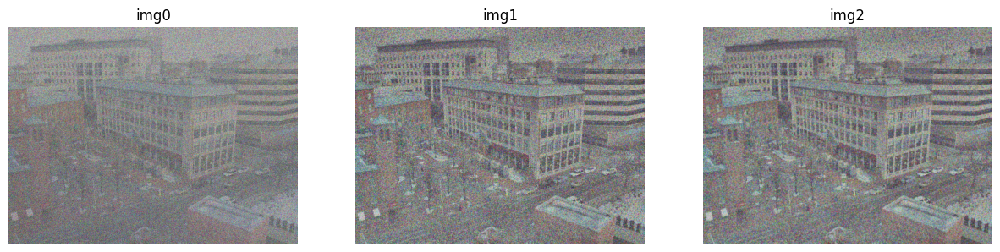

In [32]:
#
img_median_kenel_denoising1 = cv.medianBlur(clahe_img_color,5)
img_median_kenel_denoising= cv.medianBlur(img_median_kenel_denoising1,5)
show_multiple_img(1,3,(img_color,img_median_kenel_denoising1,img_median_kenel_denoising))

### The best result is achieved by Median Filter

## First apply Denising, and then apply CLAHE

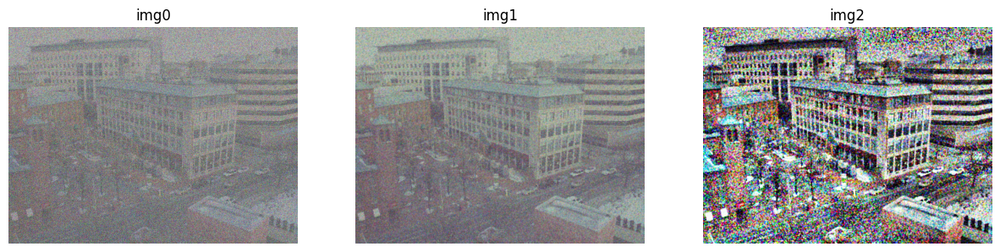

In [33]:
img_color_median_kernel_denoising1= cv.medianBlur(img_color,7)
img_color_median_kernel_denoising= cv.medianBlur(img_color_median_kernel_denoising1,7)
clahe = cv.createCLAHE(clipLimit=500)
r,g,b = cv.split(img_color_median_kernel_denoising)
clahe_r = clahe.apply(r)
clahe_g = clahe.apply(g)
clahe_b = clahe.apply(b)

clahe_img_color = cv.merge((clahe_r,clahe_g,clahe_b))

show_multiple_img(1,3,(img_color,img_color_median_kernel_denoising1,clahe_img_color))